<a href="https://colab.research.google.com/github/sungulnara2000/CrumpledDocumentsDataset/blob/master/documents_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Настройка среды

In [ ]:
!pip install opencv-contrib-python==3.4.2.17
!pip install -U plotly==4.12
!pip install pyheif Pillow
!pip install pdf2image
!apt-get install poppler-utils
!pip install alphashape

In [ ]:
!git clone https://github.com/sungulnara2000/CrumpledDocumentsDataset.git
!gdown --id 1ZUATVSd94uX7K_iSXVAAgkfYAFApV3KC
!unzip paper_distortions.zip -d CrumpledDocumentsDataset

In [7]:
import os
import glob

import numpy as np
from tqdm import tqdm
import itertools
import random

import cv2 as cv
from google.colab.patches import cv2_imshow

from IPython.display import clear_output

from multiprocessing import Pool

In [8]:
%load_ext autoreload
%autoreload 2

In [9]:
os.chdir('/content/CrumpledDocumentsDataset')

In [10]:
from src import config, utils, detection, ordering, inpainting
from src.distortion import Distortion
from src.augmentation import Augmentation

Преобразуем фотографии формата HEIC в PNG, если такие имеются

In [129]:
utils.convert_heic_to_png(config.CRUMPLED_GRIDS_FOLDER, delete=True)
utils.convert_heic_to_png(config.BACKGROUND_FOLDER, delete=True)

0it [00:00, ?it/s]
100%|██████████| 6/6 [00:35<00:00,  5.88s/it]


Преобразуем PDF документы в картинки со страницами этих документов (запускать, если есть новые документы которые нужно преобразовать)

In [ ]:
# преобразование документов по отдельности

# for f in ['functional_analysis.pdf', 'mouse.pdf', '2002_09589.pdf', '2102_12092.pdf']:
#   utils.convert_single_pdf_to_image(
#       os.path.join(config.EDOCS_PDF_FOLDER, f), 
#       config.EDOCS_FOLDER)

In [ ]:
# преобразование всех документов в папке

# utils.convert_pdf_to_image(config.EDOCS_PDF_FOLDER, config.EDOCS_FOLDER)

100%|██████████| 6/6 [00:48<00:00,  8.10s/it]


# Предобработка

В этом разделе обрабатываются фотографии смятых сеток: 
* найденные координаты и размеры ключевых точек сохраняются в config.KEY_POINTS_FOLDER
* результаты замазывания маркеров сохраняются в config.INPAINTED_FOLDER

In [ ]:
def prepare_crumple(crumpled_grid_path):
  try:
    key_points = detection.detect_markers(crumpled_grid_path)
    inpainting.inpaint_key_points(crumpled_grid_path, key_points, gray=True)
    print('DONE: ', os.path.basename(crumpled_grid_path))
  except:
    print('ERROR: ', os.path.basename(crumpled_grid_path))

In [ ]:
# crumpled_grid_paths = glob.glob(f'{config.CRUMPLED_GRIDS_FOLDER}/*')
# failed = []

# with Pool(2) as p:
#   p.map(prepare_crumple, crumpled_grid_paths)

# Смятие

In [11]:
GENERATORS = {}

for name, source_folder in zip(
    ['grid', 'document', 'background'],
    [config.CRUMPLED_GRIDS_FOLDER, config.EDOCS_FOLDER, config.BACKGROUND_FOLDER]):
  
  image_list = glob.glob(f"{source_folder}/*")
  random.shuffle(image_list)
  GENERATORS[name] = itertools.cycle(image_list)

In [12]:
# SHOW_SIZE = (1512, 2016)
SHOW_SIZE = (1058, 1411)
INPUT_SIZE = (3312, 4678)

Генерируем смятые документы, ошибки записываются в exceptions.txt.  
Результаты сохраняются в config.CRUMPLED_RESULTS_FOLDER и config.AUGMENTATIONS_FOLDER

In [13]:
def generate_crumpled_documents(use_n_grids, n_augmentations, plot=False):
    """
    :param use_n_grids: Сколько смятых сеток нужно прогнать
    :param n_augmentations: Количество аугментация для каждой смятой сетки
    :param plot: Нужна ли отрисовка результатов
    """
    for i in tqdm(range(use_n_grids)):
        grid = next(GENERATORS['grid'])

        print('\n', os.path.basename(grid))

        try:
            dist = Distortion(grid, INPUT_SIZE)
            transformed = dist.transform(
                document,
                background,
                resize=True)

        except Exception as e:
            print('\nERROR\n')
            with open('exceptions.txt', 'a') as f:
                f.write('-----------------------------------------' + '\n')
                f.write(grid + '\n')
                f.write('\n' + str(e) + '\n')
            continue

        for j in tqdm(range(n_augmentations)):
            try:
              aug = Augmentation(dist, decrease_rate_range=np.arange(0.4, 1, 0.1))

              document = next(GENERATORS['document'])
              background = next(GENERATORS['background'])

              transformed_aug = aug.transform(
                  document,
                  background,
                  resize=True)

              save_name = f'{utils.get_file_name(grid)}_{utils.get_file_name(document)}_{utils.get_file_name(background)}_NUM_{j}.png'
              cv.imwrite(os.path.join(config.AUGMENTATIONS_FOLDER, save_name), transformed_aug)

              if plot:
                  print(f'\nАугментации, уменьшение в {aug.decrease_rate}')
                  cv2_imshow(cv.resize(transformed_aug, SHOW_SIZE))

            except Exception as e_aug:
                print('\nAUGMENTATION ERROR')
                with open('exceptions.txt', 'a') as f:
                    f.write('-----------------------------------------' + '\n')
                    f.write(grid + '\n')
                    f.write('AUGMENTATION ERROR\n')
                    f.write('\n' + str(e_aug) + '\n')


  0%|          | 0/5 [00:00<?, ?it/s]


 IMG_4379.png


 20%|██        | 1/5 [00:00<00:01,  2.09it/s]


ERROR


 IMG_4322.png



  0%|          | 0/4 [00:00<?, ?it/s]


Аугментации, уменьшение в 0.5


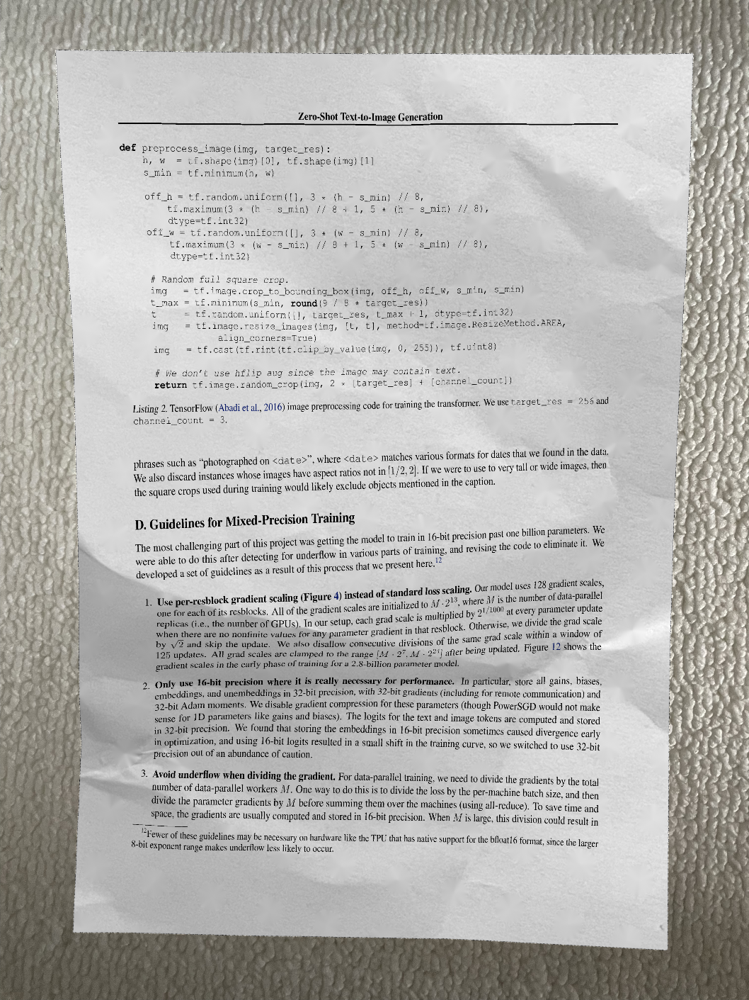


 25%|██▌       | 1/4 [00:10<00:31, 10.48s/it]


Аугментации, уменьшение в 0.7999999999999999


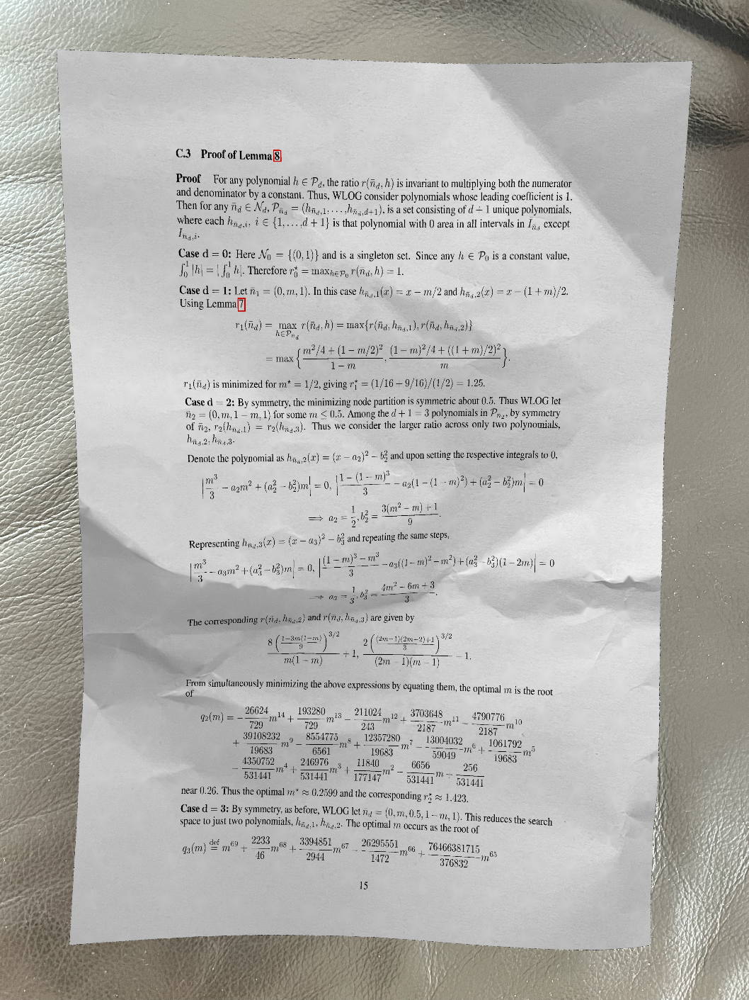


 50%|█████     | 2/4 [00:20<00:19,  9.99s/it]


Аугментации, уменьшение в 0.6


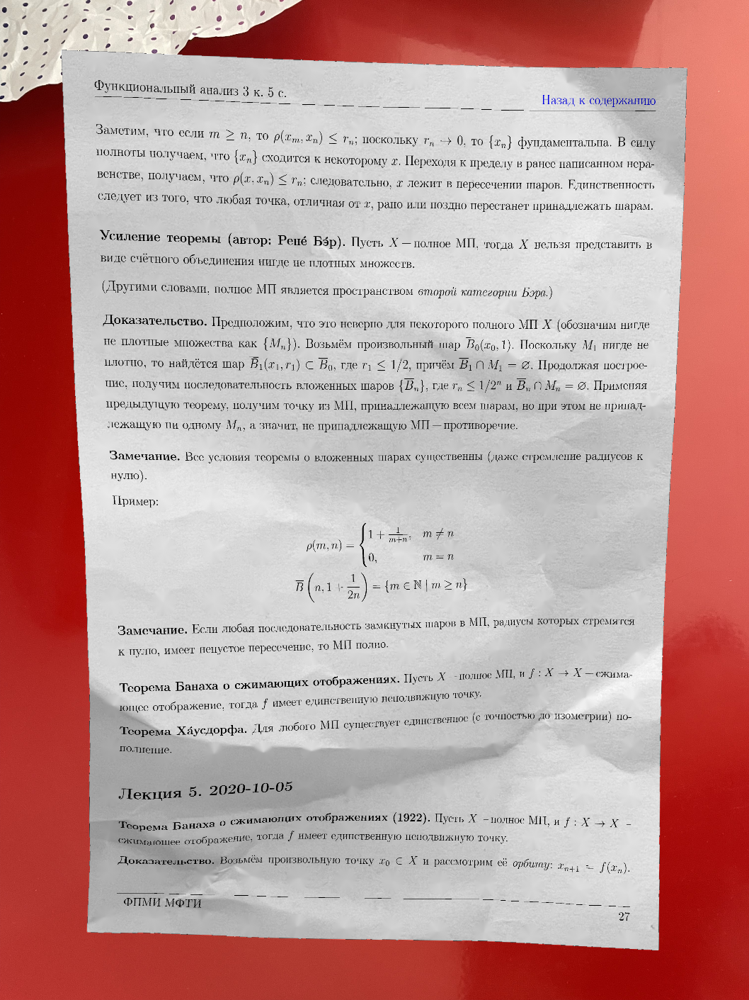


 75%|███████▌  | 3/4 [00:29<00:09,  9.60s/it]


Аугментации, уменьшение в 0.4


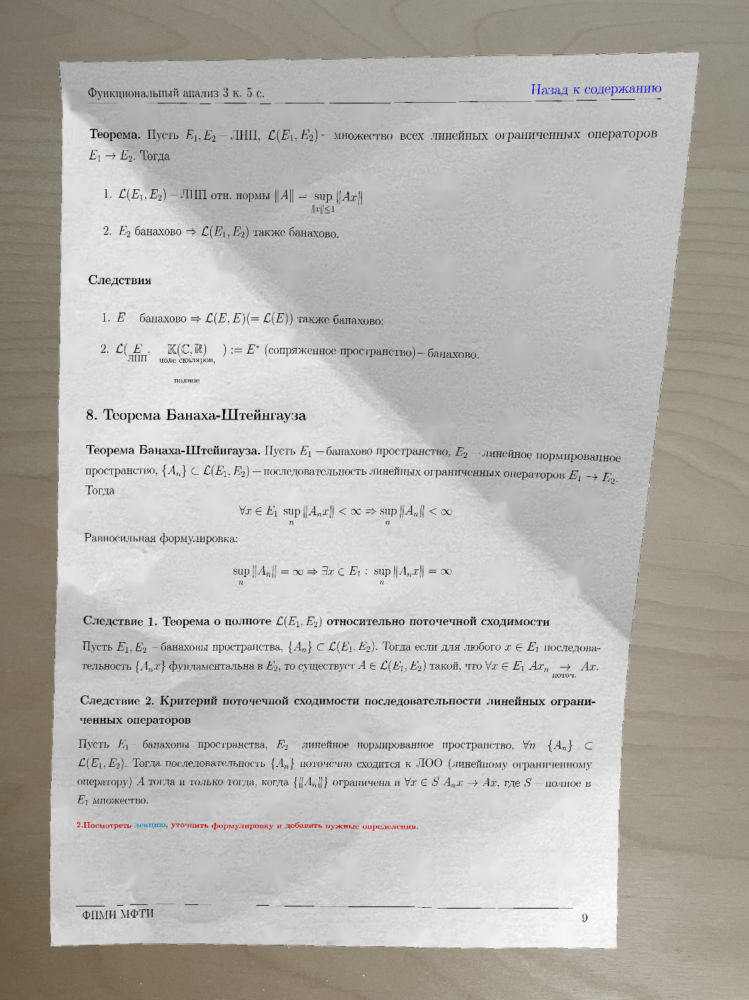


 40%|████      | 2/5 [00:51<01:29, 29.95s/it]


 IMG_3255.png


 60%|██████    | 3/5 [00:51<00:33, 16.65s/it]


ERROR


 IMG_4281.png



  0%|          | 0/4 [00:00<?, ?it/s]


Аугментации, уменьшение в 0.8999999999999999


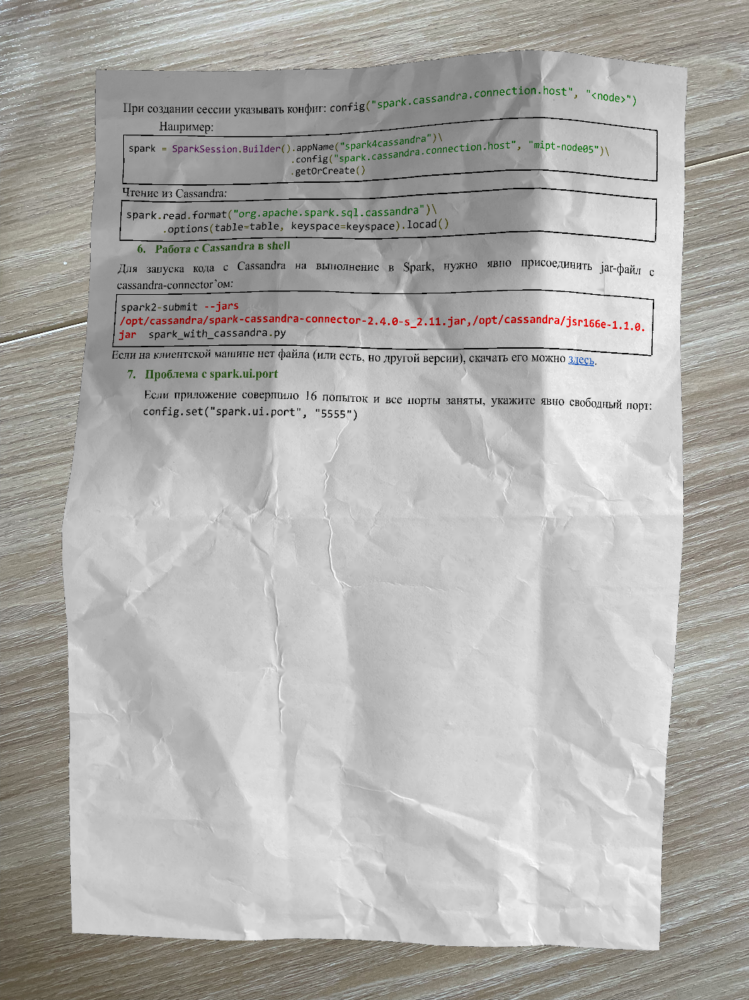


 25%|██▌       | 1/4 [00:08<00:26,  8.73s/it]


Аугментации, уменьшение в 0.8999999999999999


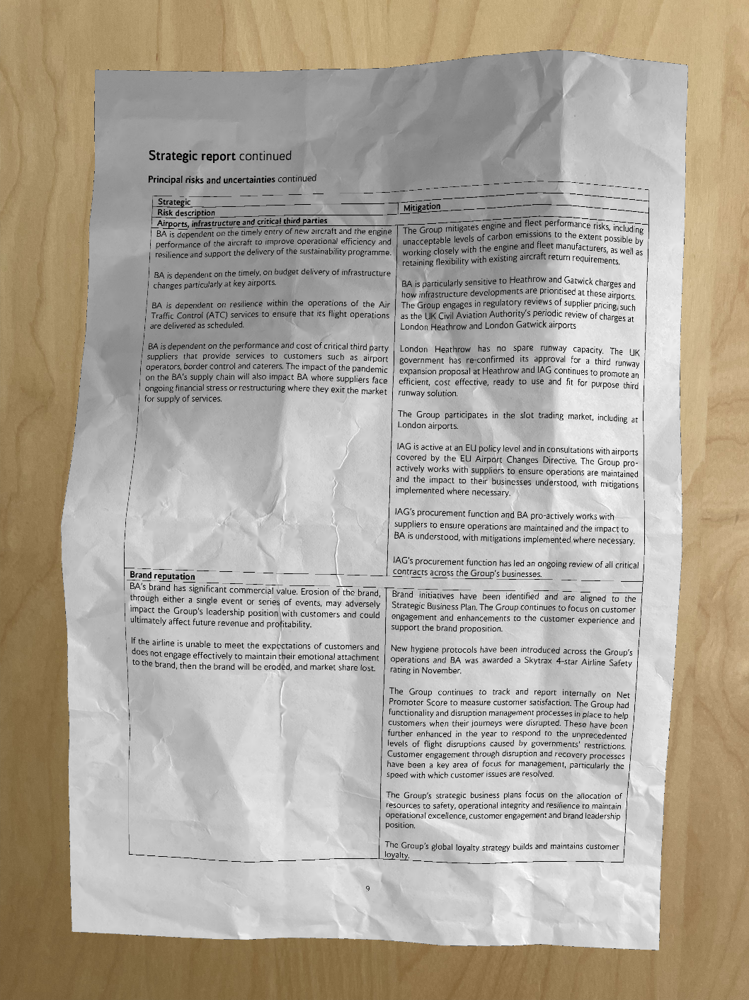


 50%|█████     | 2/4 [00:17<00:17,  8.95s/it]


Аугментации, уменьшение в 0.8999999999999999


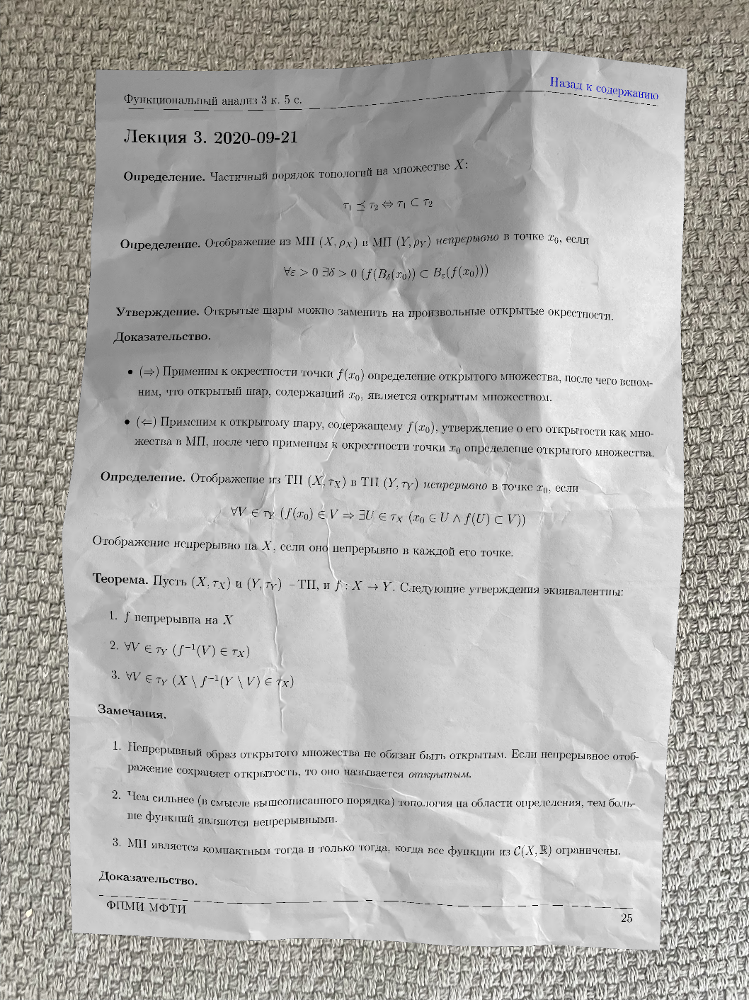


 75%|███████▌  | 3/4 [00:27<00:09,  9.10s/it]


Аугментации, уменьшение в 0.5


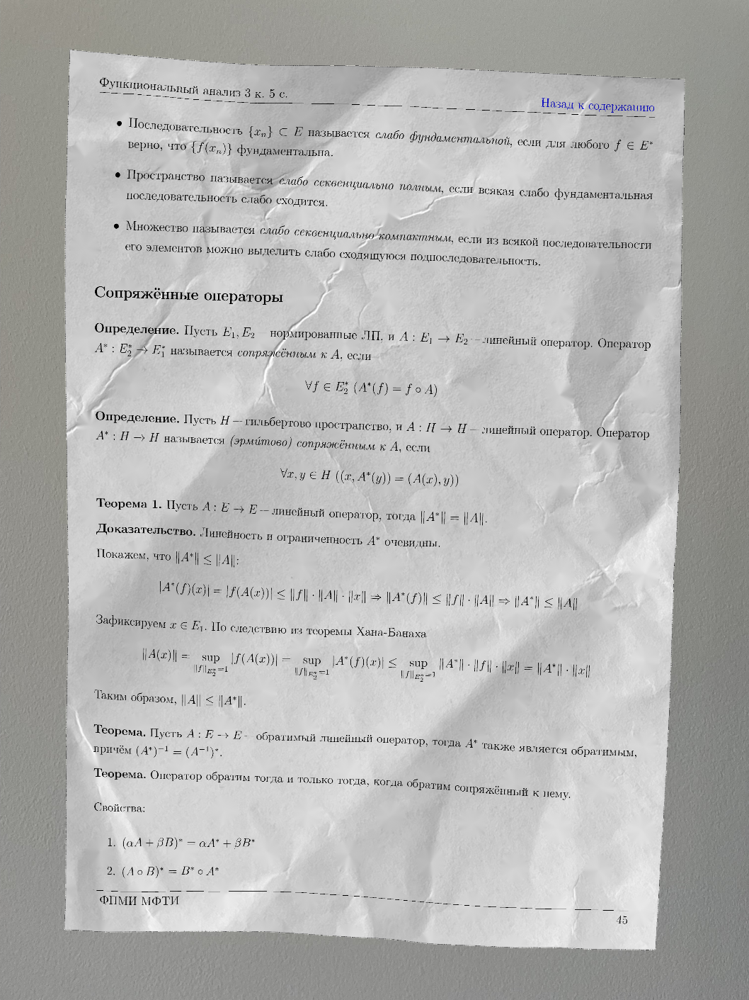


 80%|████████  | 4/5 [01:40<00:29, 29.30s/it]


 IMG_3256.png


100%|██████████| 5/5 [01:41<00:00, 20.28s/it]


ERROR



In [16]:
generate_crumpled_documents(use_n_grids=5, n_augmentations=4, plot=True)